**Name:** Trần Đức Thuỵ

**Gmail:** tdthuycg2001@gmail.com

**Address:** Ho Chi Minh City

# IMPORT LIBRARIES

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px
from sklearn.metrics import mean_squared_error
sns.set()

# VIC Data

## Read data

In [33]:
# Đọc dữ liệu
vic_data = pd.read_csv("VIC.csv")
vic_data.head(50)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,VIC,10/17/2018 9:39,98.5,98.5,98.5,98.5,390,0
1,VIC,10/17/2018 9:40,98.5,98.5,98.5,98.5,760,0
2,VIC,10/17/2018 9:41,98.6,98.6,98.6,98.6,2060,0
3,VIC,10/17/2018 9:42,98.6,98.6,98.6,98.6,5540,0
4,VIC,10/17/2018 9:43,98.6,98.7,98.6,98.7,760,0
5,VIC,10/17/2018 9:44,98.7,98.7,98.7,98.7,2580,0
6,VIC,10/17/2018 9:45,98.8,98.8,98.8,98.8,150,0
7,VIC,10/17/2018 9:47,98.7,98.8,98.7,98.7,2070,0
8,VIC,10/17/2018 9:48,98.7,98.8,98.7,98.8,12100,0
9,VIC,10/17/2018 9:50,98.8,98.8,98.8,98.8,100,0


In [34]:
vic_data.shape

(101266, 8)

- Dữ liệu có tổng cộng: **101266 dòng và 8 cột**

In [35]:
# Kiểm tra dòng trùng
print("Number of duplicated rows: ",np.sum(vic_data.duplicated()))

Number of duplicated rows:  0


- Dữ liệu không có dòng trùng nhau

In [36]:
# Kiểm tra kiểu dữ liệu
vic_data.dtypes

Ticker            object
Date/Time         object
Open             float64
High             float64
Low              float64
Close            float64
Volume             int64
Open Interest      int64
dtype: object

In [37]:
# Chuyển đổi kiểu dữ liệu cột Date/Time từ object sang datetime
vic_data["Date/Time"] = pd.to_datetime(vic_data["Date/Time"], format="%m/%d/%Y %H:%M")
vic_data["Date/Time"]

0        2018-10-17 09:39:00
1        2018-10-17 09:40:00
2        2018-10-17 09:41:00
3        2018-10-17 09:42:00
4        2018-10-17 09:43:00
                 ...        
101261   2020-12-22 14:22:00
101262   2020-12-22 14:23:00
101263   2020-12-22 14:24:00
101264   2020-12-22 14:25:00
101265   2020-12-22 14:46:00
Name: Date/Time, Length: 101266, dtype: datetime64[ns]

## Descriptive Statistics

### Numerical data 

In [38]:
nume_df = vic_data.select_dtypes(include=np.number)
missing_percentage = np.sum(nume_df.isna(), axis=0)*100/len(vic_data)
mean_sr = np.mean(nume_df, axis=0)
std_sr = np.std(nume_df, axis =0)
median_sr = np.median(nume_df, axis=0)
max_sr = np.max(nume_df, axis=0)
min_sr = np.min(nume_df,axis=0)
statistic_df = pd.DataFrame({"Missing Percentage": missing_percentage,"Mean":mean_sr, "Standard Deviation": std_sr, "Median": median_sr, "Max":max_sr, "Min": min_sr})
statistic_df.T

,Open,High,Low,Close,Volume,Open Interest
Missing Percentage,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.0
Mean,105.376460,105.418519,105.334147,105.378791,3.182640e+03,0.0
Standard Deviation,11.543101,11.535527,11.552281,11.544997,1.469807e+04,0.0
Median,105.300000,105.300000,105.200000,105.300000,1.020000e+03,0.0
Max,126.100000,126.500000,126.100000,126.500000,1.468390e+06,0.0
Min,68.000000,68.000000,68.000000,68.000000,1.000000e+01,0.0


**Nhận xét:**
- Các cột thuộc tính đều không có dữ liệu bị thiếu
- Không có các dòng dữ liệu trùng nhau
- Các cột dữ liệu đều có giá trị dương, không có giá trị không hợp lệ (invalid data)
- Cột Open Interest có các giá trị đều là 0.0, khi thiết kế mô hình dự đoán có thể cân nhắc loại bỏ cột này

### Categorical data

In [39]:
# Kiểm tra khoảng của dữ liệu thời gian
oldest_dt = vic_data["Date/Time"].sort_values().values[0]
latest_dt = vic_data["Date/Time"].sort_values().values[-1]
oldest_dt, latest_dt

(numpy.datetime64('2018-10-17T09:39:00.000000000'),
 numpy.datetime64('2020-12-22T14:46:00.000000000'))

**Do thị trường chứng khoán mở phiên vào 9:00 và đóng cửa lúc 15:00 nên cần kiểm tra thời gian có thoả mãn điều kiện này hay không?**
- Hàm *check_datetime* sẽ kiểm tra từng giá trị trong thuộc tính Date/Time, trả về True nếu thoả điều kiện ngược lại trả về False
- Biến *number_valid_value* là số những dữ liệu thoả điều kiện
- Cuối cùng sẽ in ra số dữ liệu không thoả mãn: *len(data) - number_valid_value*

In [40]:
def check_datetime(datetime):
    time = datetime.time()
    start = dt.time(9,0)
    end = dt.time(15,0)
    if time>=start and time<=end:
        return True
    return False

number_valid_value = np.sum(vic_data["Date/Time"].apply(check_datetime))

print("\nSo du lieu thoi gian khong hop le: ", len(vic_data) - number_valid_value, "\n")


So du lieu thoi gian khong hop le:  0 



In [41]:
cate_df = vic_data.select_dtypes(include=["object","datetime"])
missing_percentage = np.sum(cate_df.isna(), axis=0)*100/len(vic_data)
unique_sr = cate_df.nunique(axis=0)
statistic_df = pd.DataFrame({"Missing Percentage": missing_percentage,"Num_unique": unique_sr})
statistic_df

,Missing Percentage,Num_unique
Ticker,0.0,1
Date/Time,0.0,101266


**Nhận xét:**
- Các nhãn cổ phiếu đều đồng nhất (mã VIC)
- Các giá trị date/time là phân biệt, không có giá trị thời gian trùng lặp
- Không có dữ liệu không hợp lệ, các giao dịch trong ngày đều nằm trong khoảng thời gian **9:00 - 15:00**
- Dữ liệu từ **17/10/2018 - 22/12/2020**

## Data Visualization

In [42]:
# Biểu đồ thể hiện biến động giá mở cửa và đóng cửa theo thời gian 
fig1 = px.line(vic_data, x="Date/Time", y="Open",color_discrete_sequence=["green"], title="Open price by date")
fig2 = px.line(vic_data, x="Date/Time", y="Close",color_discrete_sequence=["red"], title="Close price by date")
fig1.update_layout(
    autosize=False,
    width=1000,
    height=500)
fig2.update_layout(
    autosize=False,
    width=1000,
    height=500)
fig1.show()
fig2.show()

In [43]:
fig3 = px.bar(vic_data.groupby(vic_data["Date/Time"].dt.date)["Volume"].mean().reset_index(), x="Date/Time", y="Volume",color_discrete_sequence=["red"],title="Volume by date")
fig3.update_layout(
    autosize=False,
    width=1000,
    height=600)
fig3.show()

In [44]:
mean_squared_error(vic_data["Open"], vic_data["Close"])

0.0221532399818301

**Nhận xét:**
- Biến thiên giá Open và Close có sự chênh lệch không nhiều, độ đo MSE= 0.315184 với 125309 mẫu 


**Trực quan hoá yếu tố Trend, Seasonality, Noise của chuỗi thời gian**

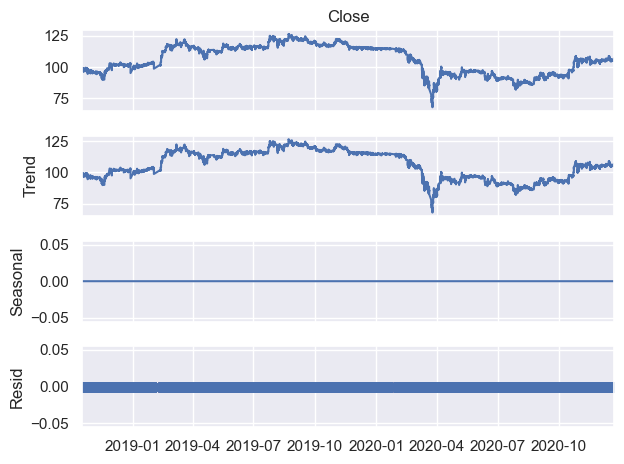

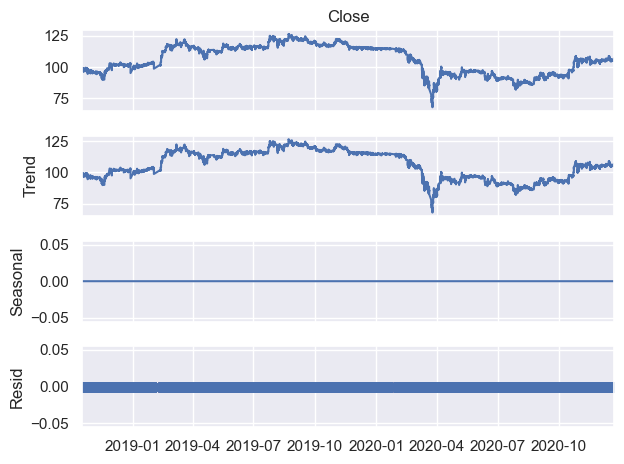

In [45]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

df = vic_data.copy()
df = df.set_index(["Date/Time"])

#Ta xem giá trị chuỗi thời gian là tổng các yếu tố Trend, Seasonality và Noise


result_add = seasonal_decompose(df["Close"], model='additive',extrapolate_trend='freq', period=1)

result_add.plot()


**Nhận xét:**
- Giá cổ phiếu không có tính seasonality 

## Data Exploration

In [46]:
# Số ngày giao dịch
len(vic_data.groupby(vic_data["Date/Time"].dt.date))

548

In [47]:
#Tổng lượng cổ phiếu giao dịch
total_volume = np.sum(vic_data["Volume"])
total_volume

322293180

In [48]:
# Xem ngày có giá đóng cửa thấp nhất
vic_data.groupby(vic_data["Date/Time"].dt.date).apply(lambda x: x.sort_values("Date/Time").iloc[-1]).sort_values("Close").head(10)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,,
2020-03-24,VIC,2020-03-24 14:46:00,71.5,71.5,71.5,71.5,65160,0
2020-03-25,VIC,2020-03-25 14:46:00,76.5,76.5,76.5,76.5,41490,0
2020-03-23,VIC,2020-03-23 14:46:00,76.8,76.8,76.8,76.8,12450,0
2020-03-30,VIC,2020-03-30 14:46:00,81.4,81.4,81.4,81.4,121470,0
2020-03-26,VIC,2020-03-26 14:46:00,81.8,81.8,81.8,81.8,5780,0
2020-03-20,VIC,2020-03-20 14:46:00,82.5,82.5,82.5,82.5,414330,0
2020-03-31,VIC,2020-03-31 14:46:00,83.4,83.4,83.4,83.4,166750,0
2020-07-29,VIC,2020-07-29 14:46:00,83.5,83.5,83.5,83.5,14050,0
2020-07-27,VIC,2020-07-27 14:46:00,85.0,85.0,85.0,85.0,66610,0


In [49]:
# Xem ngày có giá đóng cửa cao nhất
vic_data.groupby(vic_data["Date/Time"].dt.date).apply(lambda x: x.sort_values("Date/Time", ascending=False).iloc[-1]).sort_values("Close",
                                                                                                                                 ascending=False).head(10)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,,
2019-08-23,VIC,2019-08-23 09:15:00,126.1,126.1,126.1,126.1,23990,0
2019-08-27,VIC,2019-08-27 09:15:00,124.9,125.0,124.9,125.0,9540,0
2019-08-26,VIC,2019-08-26 09:15:00,125.0,125.0,125.0,125.0,19100,0
2019-07-30,VIC,2019-07-30 09:15:00,124.4,124.4,124.4,124.4,4430,0
2019-09-17,VIC,2019-09-17 09:15:00,123.7,123.7,123.7,123.7,13310,0
2019-09-03,VIC,2019-09-03 09:15:00,123.5,123.5,123.5,123.5,3840,0
2019-08-29,VIC,2019-08-29 09:15:00,123.5,123.5,123.5,123.5,21290,0
2019-09-04,VIC,2019-09-04 09:15:00,123.0,123.2,123.0,123.2,2130,0
2019-08-01,VIC,2019-08-01 09:15:00,123.0,123.2,123.0,123.2,3270,0


In [50]:
# Xem ngày có lượng giao dịch nhiều nhất
vic_data.groupby(vic_data["Date/Time"].dt.date)["Volume"].sum().sort_values(ascending=False)

Date/Time
2020-04-07    2855700
2020-04-06    2698260
2020-05-13    2652530
2019-02-01    2095840
2020-03-12    1896270
               ...   
2020-09-23     111830
2019-08-12     107460
2020-01-14     101150
2020-07-01      92060
2020-10-05      90450
Name: Volume, Length: 548, dtype: int64

In [58]:
# Kiểm tra tháng có ngày mà khối lượng giao dịch cao nhất
df = vic_data.groupby(vic_data["Date/Time"].dt.date).agg({"Close":"mean","Volume":"sum"})
df = df.reset_index()
df["Date/Time"] = pd.to_datetime(df["Date/Time"])
df.loc[(df["Date/Time"].dt.month==4) & (df["Date/Time"].dt.year==2020),:]

,Date/Time,Close,Volume
362,2020-04-01,86.096277,437820
363,2020-04-03,88.197642,1184500
364,2020-04-06,93.680088,2698260
365,2020-04-07,96.576786,2855700
366,2020-04-08,94.745701,760120
367,2020-04-09,94.564815,1560610
368,2020-04-10,94.688785,983120
369,2020-04-13,95.452113,1411550
370,2020-04-14,95.645972,631630
371,2020-04-15,95.214904,1176850


In [62]:
# Thống kê cho từng năm
vic_data.iloc[:,1:].groupby(by=vic_data["Date/Time"].dt.year).mean()

,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,
2018,2018-11-21 04:28:17.457022464,98.546081,98.590799,98.509850,98.559142,3875.071900,0.0
2019,2019-07-04 08:59:58.667186176,115.856112,115.893391,115.819969,115.860761,2886.336482,0.0
2020,2020-07-04 06:03:11.644178176,97.235760,97.281618,97.186722,97.233952,3317.385474,0.0


**Nhận xét:**
- Tổng cộng trong **548 ngày với 322.293.180 cổ phiếu** được giao dịch. Thời điểm **23/08/2019**, cổ phiếu VIC đạt mức **126.000đ/cp**, giá cao nhất được thiết lập. Sau đó, từ cuối năm 2019, giá cổ phiếu giảm liên tục, giảm sâu về **71.000đ/cp,** mức giá thấp nhất được thiết lập vào **24/03/2022.** Các khoảng thời gian khác, giá cổ phiếu loanh quanh mức trên 95.000đ/cp
- Số giao dịch nhiều nhất được ghi nhận vào ngày **07/04/2020** với **2.885.700 cổ phiếu** được mua bán. Từ thời điểm này về sau giá cổ phiếu có xu hướng tăng nhẹ. Lượng giao dich về cuối năm 2020 có cao, cùng với đó là giá cổ phiếu tăng, cho thấy khuynh hướng tăng giá trong tương lai
- Đầu năm 2020 đợt dịch Covid-19 thứ nhất xảy ra là sự kiện thiên nga đen, tác động tiêu cực đến giá của hầu hết các cổ phiếu nói chung và VIC nói riêng. Từ đầu 4/2020, volume tăng cao kéo theo giá cổ phiếu tăng dần, có thể thấy có dòng tiền lớn đổ vào. Càng về cuối năm 2020, giá cổ phiếu có xu hướng hồi phục dần.

## ARIMA MODEL

In [52]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

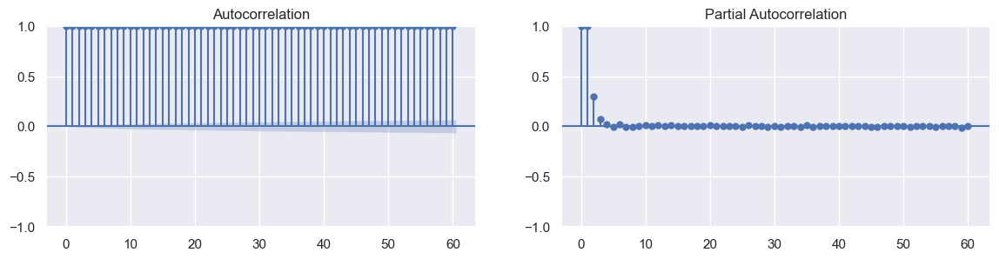

In [53]:
fig, axes = plt.subplots(1,2,figsize=(14,3), dpi= 100)
plot_acf(vic_data["Close"].values.tolist(), lags=60,ax=axes[0])
plot_pacf(vic_data["Close"].values.tolist(), lags=60, ax=axes[1]);

In [54]:
from pmdarima.arima import auto_arima
grid_arima = auto_arima(vic_data["Close"].values, start_p=0, start_q=0, max_p=2, max_q=2,
                       max_d=2, d=0, start_P = 0, seasonal=False, ic=["aic"], trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1231895.919, Time=0.69 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=1.95 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=6.89 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-49489.636, Time=3.64 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-49564.763, Time=7.34 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=2.88 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-49564.540, Time=4.05 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-49562.819, Time=5.51 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-49571.962, Time=47.38 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-49496.706, Time=21.22 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=5.69 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-49572.009, Time=17.73 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-49569.775, Time=17.41 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 142.380 seconds


In [55]:
grid_arima = auto_arima(vic_data["Close"].values, start_p=0, start_q=0, max_p=2, max_q=2,
                       d=1, start_P = 0, seasonal=False, ic=["aic"], trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-39250.582, Time=7.47 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-49029.696, Time=4.72 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-49503.070, Time=15.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-39252.569, Time=3.63 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-49577.746, Time=6.28 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-49576.519, Time=6.05 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-49577.870, Time=12.10 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-49575.765, Time=12.23 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-49574.946, Time=41.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=-49579.842, Time=6.70 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=-49577.736, Time=4.88 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-49579.717, Time=2.83 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=-49576.916, Time=17.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-49505.040, Time=3.10 sec


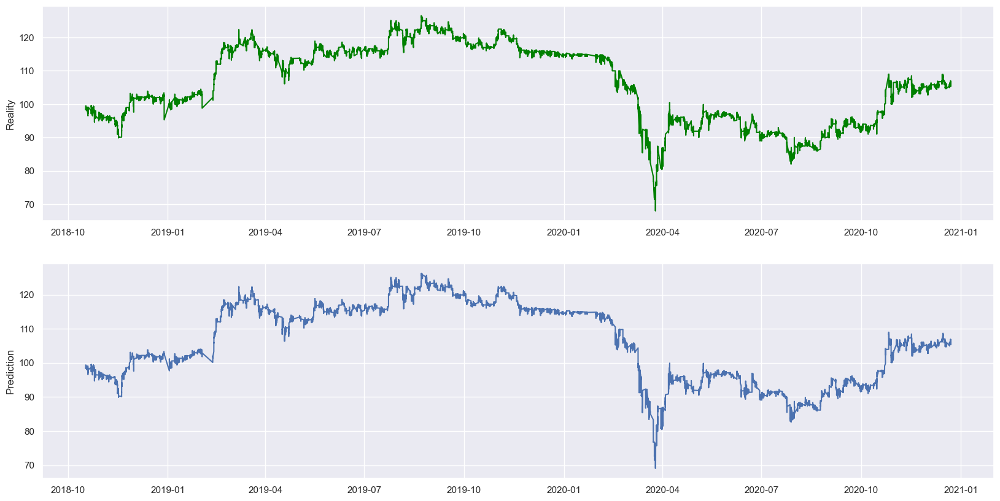

In [60]:
arima = ARIMA(vic_data["Close"].values, order = (1,1,2))
model = arima.fit()
predict = model.predict()
predict[0] = predict[1]
fig, axes = plt.subplots(2,1,figsize=(20,10))
axes[1].plot(vic_data["Date/Time"],predict)
axes[1].set_ylabel("Prediction")
axes[0].plot(vic_data["Date/Time"], vic_data["Close"], color="Green")
axes[0].set_ylabel("Reality")
plt.show()

In [61]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               101266
Model:                 ARIMA(1, 1, 2)   Log Likelihood               24793.921
Date:                Tue, 14 Nov 2023   AIC                         -49579.842
Time:                        11:06:52   BIC                         -49541.740
Sample:                             0   HQIC                        -49568.286
                             - 101266                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4206      0.042    -10.031      0.000      -0.503      -0.338
ma.L1          0.0948      0.042      2.258      0.024       0.013       0.177
ma.L2         -0.1085      0.014     -7.889      0.000      -0.136      -0.082
sigma2         0.0359   2.23e-05   1605.369      0.000       0.036       0.036
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):          43018791.08
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.99   Skew:                            -2.33
Prob(H) (two-sided):                  0.44   Kurtosis:                       103.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Nhận xét:**
- Mô hình ARIMA(1,,2) cho kết quả gần khớp với dữ liệu thực
- Độ đo AIC = -49579.842
- Các tham số của mô hình có p_value <0.05, đều có ý nghĩa về mặt thống kê